# <center> ***Visión computacional para imágenes y video*** </center>
## <center> ***Harris Edge & Corner Detection*** </center>
### Profesor: Gilberto Ochoa Ruiz
### Alumnos:
* Alberto Nieves Cisneros            A01793829
* Aurelio Antonio Lozano Rábago      A01081266
* Héctor Manuel González Villareal   A00178679
* Jessica Lechuga Ramos              A01793512
* Luis Alfredo Negron Naldos         A01793865

#### <p style='text-align: right;'> 26 de Febrero del 2023 </p>

## Table of Contents
1. [Libraries](#libraries)
2. [Color image to Grayscale conversion](#grayscale)
3. [Spatial derivative calculation](#spatial)
4. [Structure tensor setup](#tensor)
5. [Harris response calculation](#response)
6. [Find edges and corners using R](#find)

## Instrucciones

En esta semana se solicitan realizar los siguientes experimentos:

- En el Collab de Harris Detector, se sugiere que se hagan pruebas con imágenes propias que el equipo decida usar. La idea  es escoger un objeto y tomar fotos con diferentes tipos de iluminación (bajo el sol, en un lugar oscuro) y bajo diferentes ángulos para analizar el comportamiento del detector de Harris bajo diferentes settings

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import matplotlib.pyplot as plt
from scipy import signal as sig
import numpy as np
from scipy.ndimage.filters import convolve

C:\Users\mapc1\AppData\Local\Temp\ipykernel_33820\1510717638.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


## 1. Color to Grayscale <a class="anchor" id="grayscale" ></a>

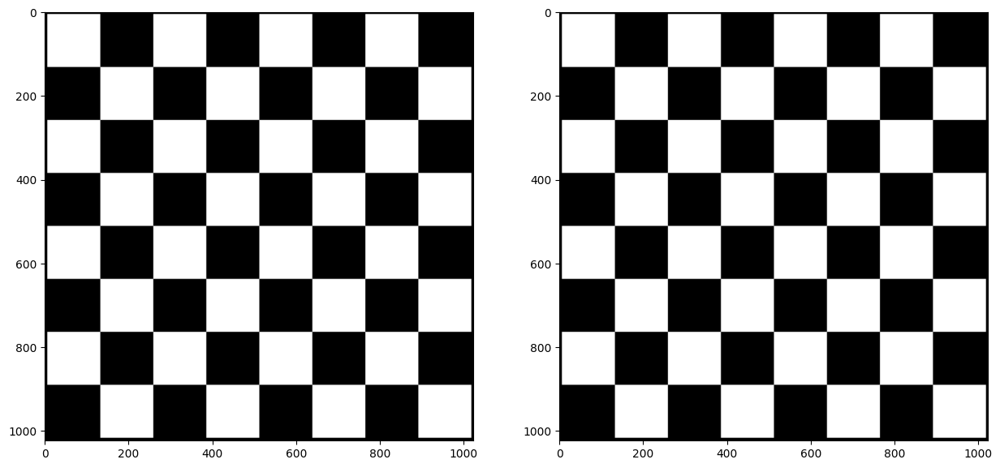

In [12]:
img = cv2.imread('data/chessboard.png')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

## 2. Spatial derivative calculation <a class="anchor" id="spatial" ></a>

In [13]:
def gradient_x(imggray):
    ##Sobel operator kernels.
    kernel_x = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    return sig.convolve2d(imggray, kernel_x, mode='same')

def gradient_y(imggray):
    kernel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
    return sig.convolve2d(imggray, kernel_y, mode='same')

I_x = gradient_x(img_gray)
I_y = gradient_y(img_gray)

## 3. Structure tensor setup <a class="anchor" id="tensor" ></a>

In [14]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g


Ixx = convolve(I_x**2, gaussian_kernel(3, 1))
Ixy = convolve(I_y*I_x, gaussian_kernel(3, 1))
Iyy = convolve(I_y**2, gaussian_kernel(3, 1))

## 4. Harris response calculation <a class="anchor" id="response" ></a>

In [15]:
k = 0.05

# determinant
detA = Ixx * Iyy - Ixy ** 2

# trace
traceA = Ixx + Iyy
    
harris_response = detA - k * traceA ** 2

In [16]:
img_gray.shape

(1024, 1024)

In [17]:
window_size = 3
offset = window_size//2
width, height = img_gray.shape

for y in range(offset, height-offset):
    for x in range(offset, width-offset):
        Sxx = np.sum(Ixx[y-offset:y+1+offset, x-offset:x+1+offset])
        Syy = np.sum(Iyy[y-offset:y+1+offset, x-offset:x+1+offset])
        Sxy = np.sum(Ixy[y-offset:y+1+offset, x-offset:x+1+offset])

In [18]:
#Find determinant and trace, use to get corner response
det = (Sxx * Syy) - (Sxy**2)
trace = Sxx + Syy
r = det - k*(trace**2)

## 5. Find edges and corners using R <a class="anchor" id="find" ></a>

In [19]:
img_copy_for_corners = np.copy(img)
img_copy_for_edges = np.copy(img)

for rowindex, response in enumerate(harris_response):
    for colindex, r in enumerate(response):
        if r > 0:
            # this is a corner
            img_copy_for_corners[rowindex, colindex] = [255,0,0]
        elif r < 0:
            # this is an edge
            img_copy_for_edges[rowindex, colindex] = [0,255,0]

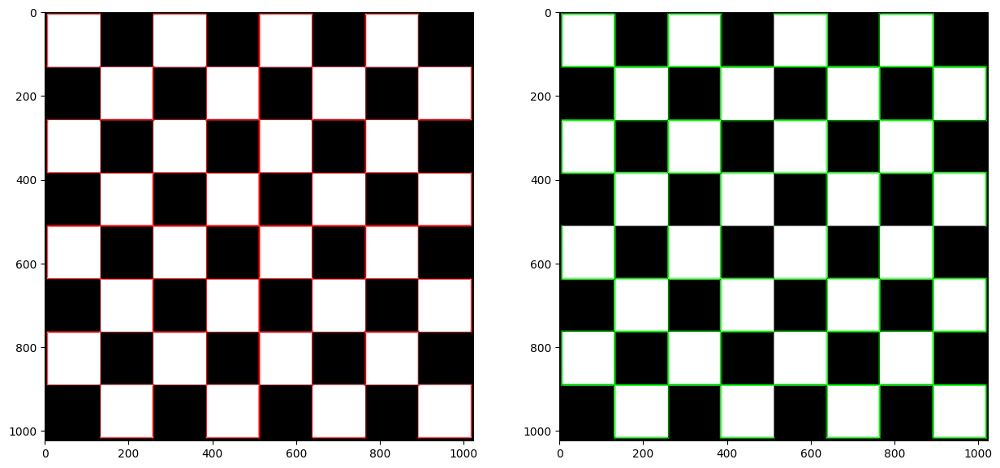

In [20]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_copy_for_corners, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_copy_for_edges, cmap="gray")

# Actividad

In [23]:
def harris_calculation(img_gray):
    #Spatial derivative calculation
    I_x = gradient_x(img_gray)
    I_y = gradient_y(img_gray)

    #Structure tensor setup
    Ixx = convolve(I_x**2, gaussian_kernel(3, 1))
    Ixy = convolve(I_y*I_x, gaussian_kernel(3, 1))
    Iyy = convolve(I_y**2, gaussian_kernel(3, 1))

    #Harris response calculation
    k = 0.05
    
    # determinant
    detA = Ixx * Iyy - Ixy ** 2
    
    # trace
    traceA = Ixx + Iyy
        
    harris_response = detA - k * traceA ** 2
    
    return harris_response

In [24]:
def find_edges_and_corner(img, harris_response):
    img_copy_for_corners = np.copy(img)
    img_copy_for_edges = np.copy(img)

    for rowindex, response in enumerate(harris_response):
        for colindex, r in enumerate(response):
            if r > 0:
                # this is a corner
                img_copy_for_corners[rowindex, colindex] = [255,0,0]
            elif r < 0:
                # this is an edge
                img_copy_for_edges[rowindex, colindex] = [0,255,0]
    return img_copy_for_corners, img_copy_for_edges

In [25]:
def print_image(im1, im2, title = '', title1 = '', title2 = ''):
    fig = plt.figure(figsize=(15, 8))
    fig.suptitle(title, size=20)

    plt.subplot(1, 2, 1)
    plt.imshow(im1)
    plt.title(title1)

    plt.subplot(1, 2, 2)
    plt.imshow(im2, cmap="gray")
    plt.title(title2)

    plt.show()

In [38]:
def find_edges_and_corner_and_print(path, show_original_image = True):
    img = cv2.imread(path)
    img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if(show_original_image):
        print_image(img_color, img_gray, 'Original Image', 'Color image', 'Grayscale image')
    
    harris_response = harris_calculation(img_gray)
    
    img_copy_for_corners, img_copy_for_edges = find_edges_and_corner(img, harris_response)

    print_image(img_copy_for_corners, img_copy_for_edges, 'Processed image', 'Corner detector', 'Edge detector')

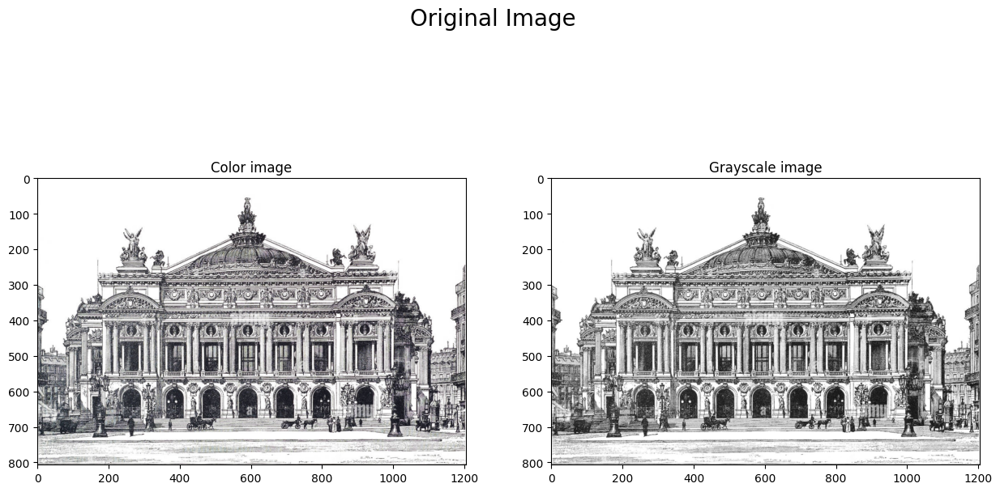

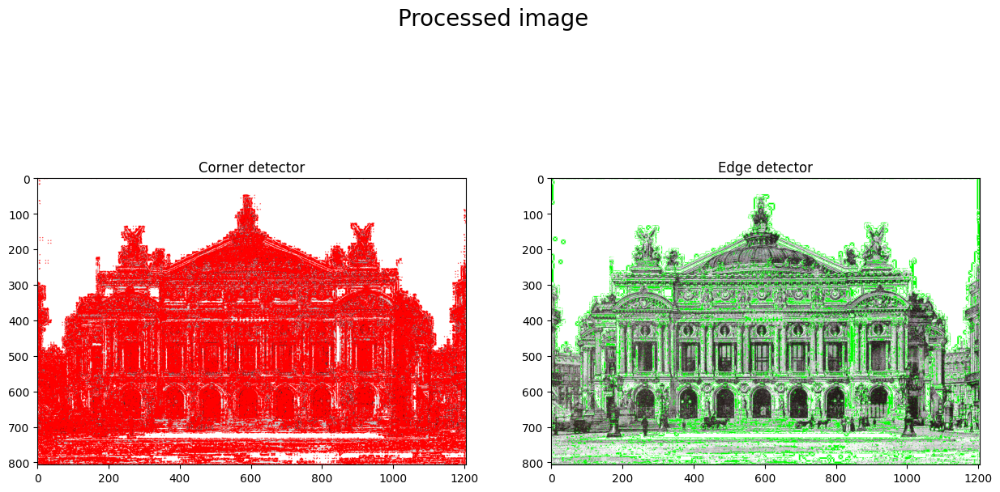

In [30]:
find_edges_and_corner_and_print("data/BuildingDrawing.png")

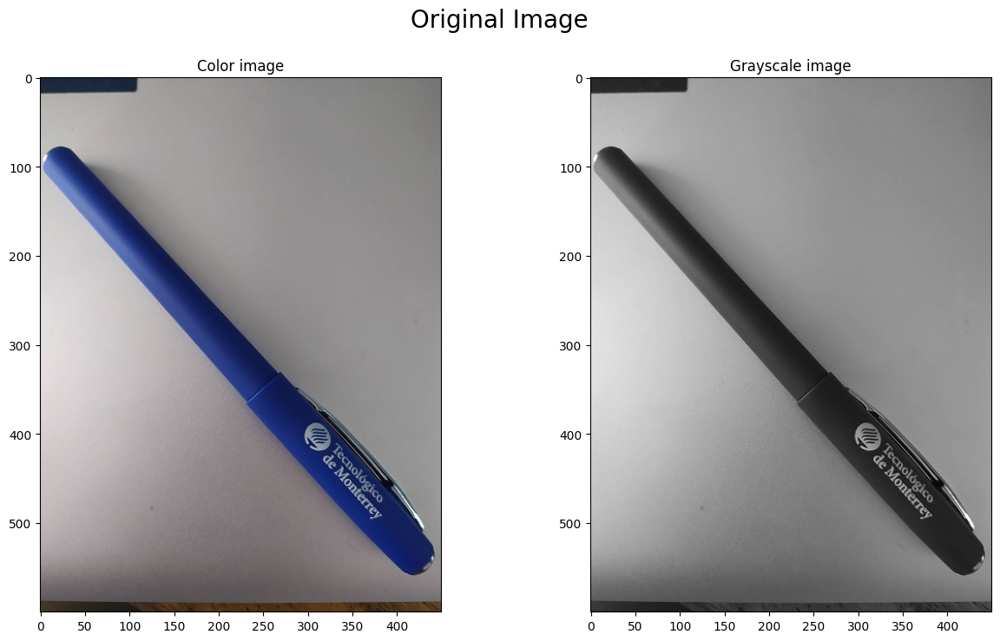

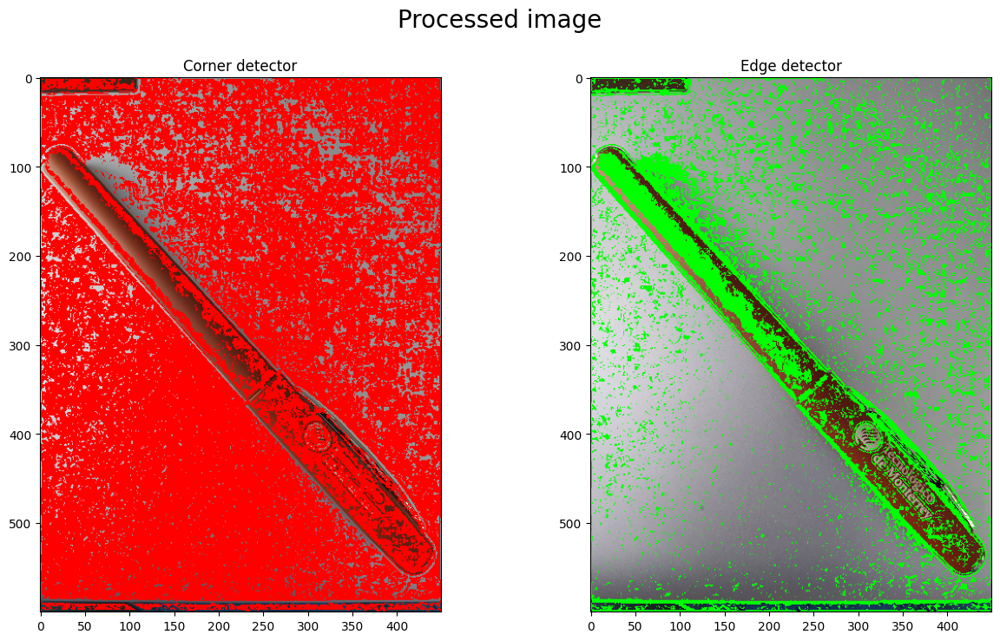

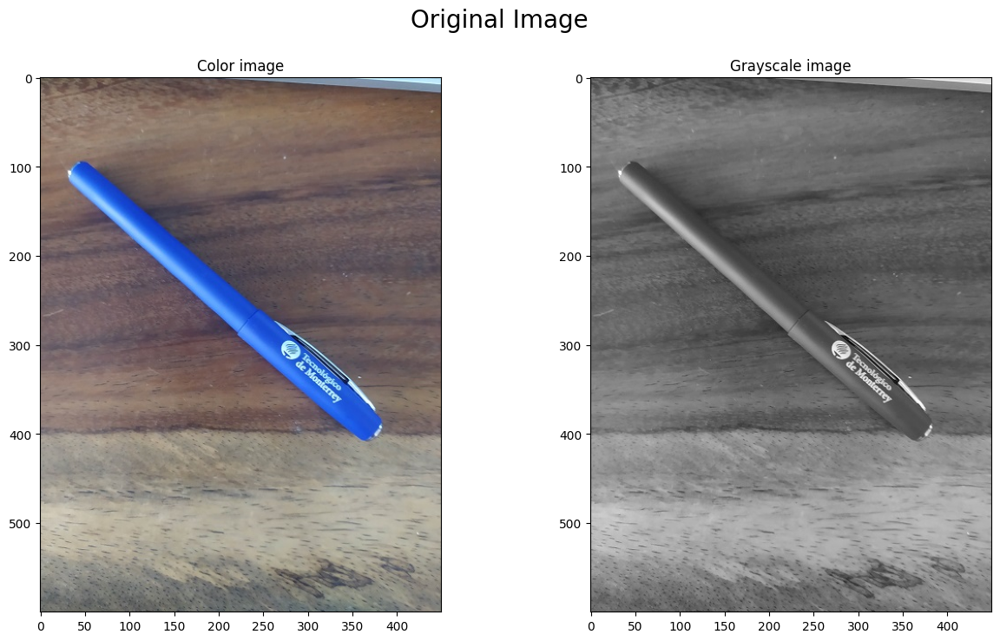

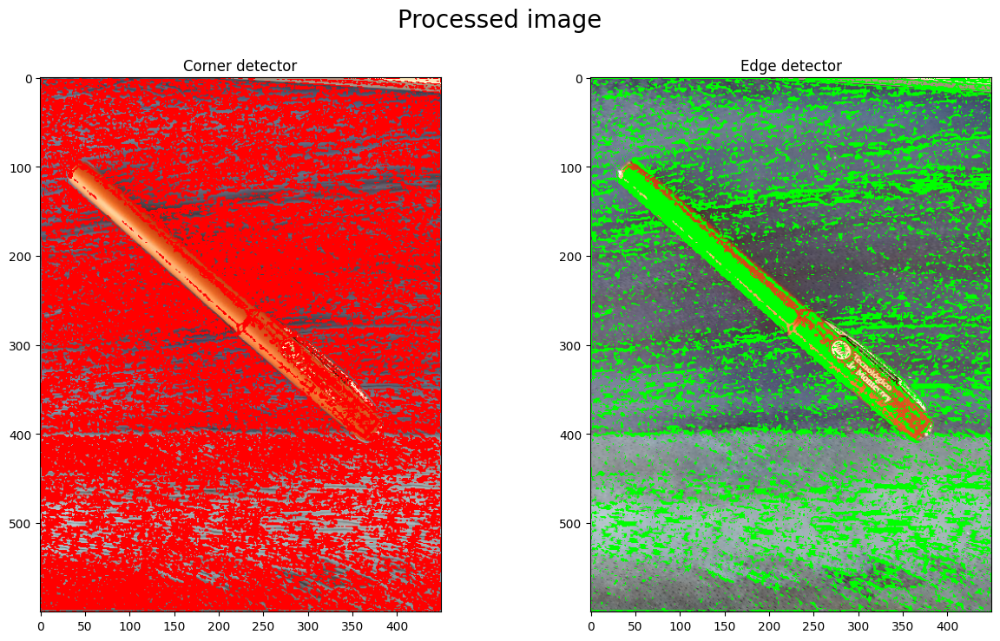

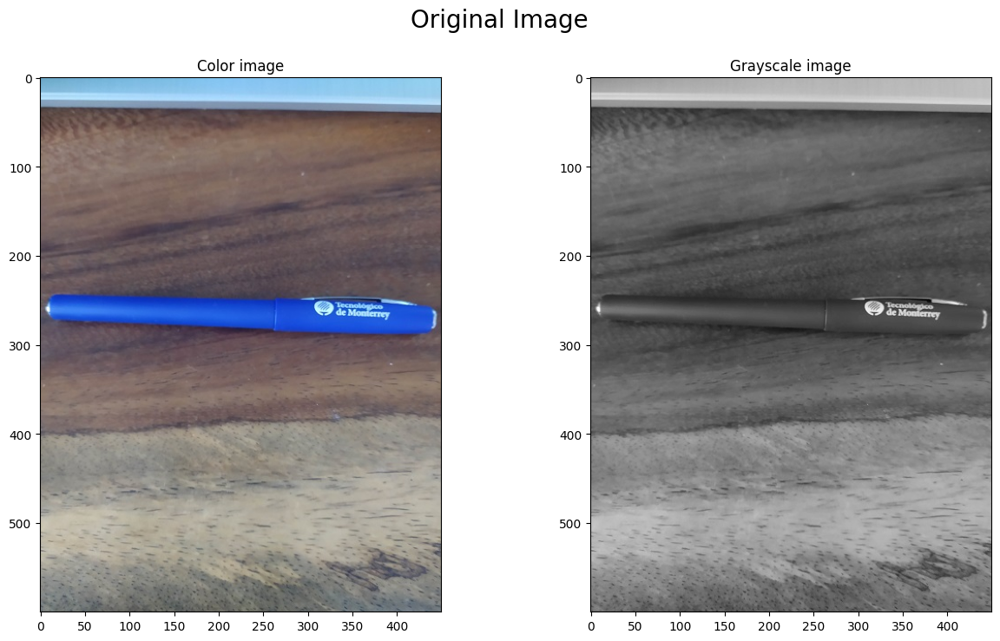

...

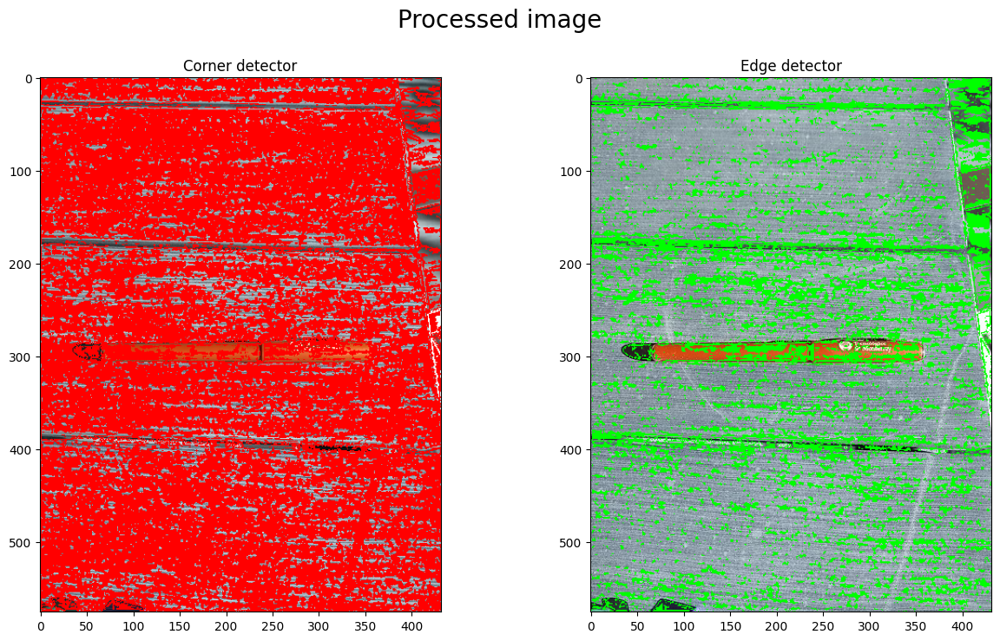

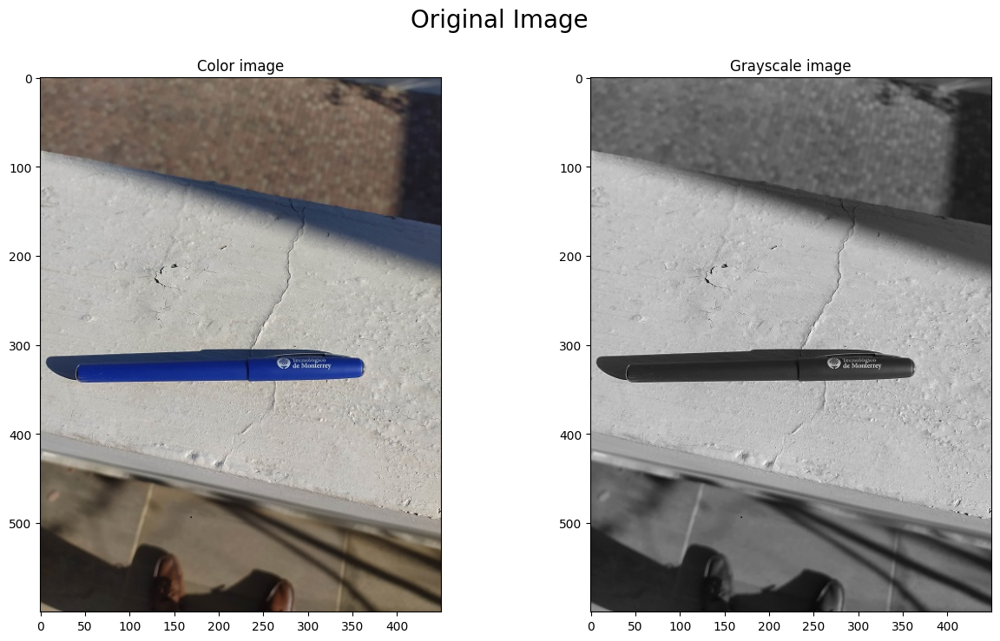

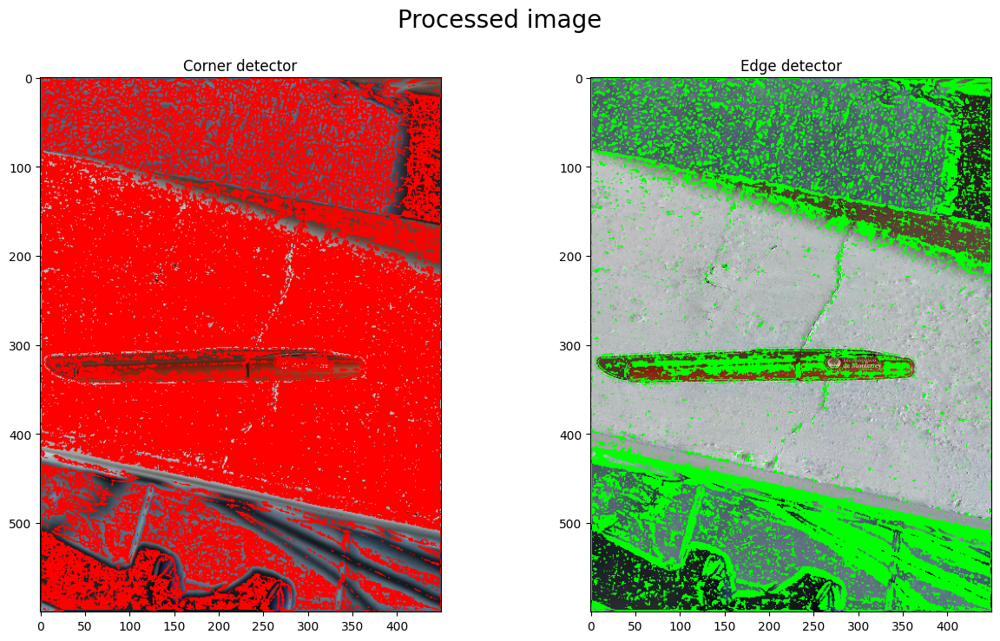

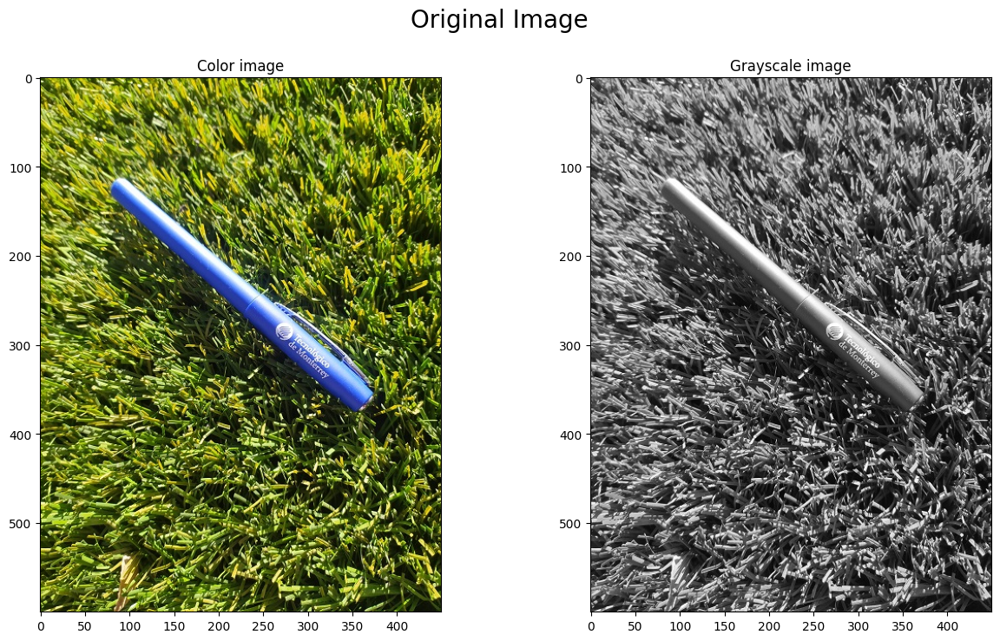

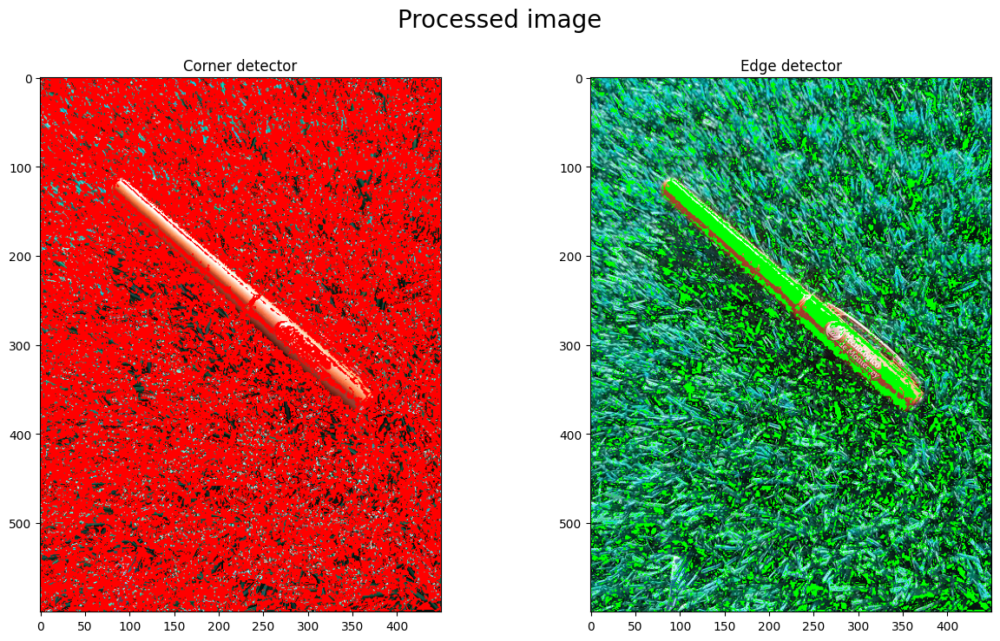

In [44]:
paths = [
    "7.2ExtCarac/IMG_20230222_170442.jpg", "7.2ExtCarac/IMG_20230222_170454.jpg", "7.2ExtCarac/IMG_20230222_170458.jpg",
    "7.2ExtCarac/IMG_20230222_170505.jpg", "7.2ExtCarac/IMG_20230222_170509.jpg", "7.2ExtCarac/IMG_20230222_170522.jpg",
    "7.2ExtCarac/IMG_20230222_170536.jpg", "7.2ExtCarac/IMG_20230222_170547.jpg"
]

for path in paths:
    find_edges_and_corner_and_print(path, True)

OBSERVATIONS HERE.........